In [58]:
from nltk import bigrams
from sklearn.svm import SVC
from tensorflow.keras import models
from tensorflow.keras import optimizers
from IPython.display import clear_output
from tensorflow.keras.models import Model
from sklearn.naive_bayes import MultinomialNB
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from gensim.parsing.preprocessing import remove_stopwords
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.feature_extraction.text import CountVectorizer
import re, time, string, requests, csv, matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np, pandas as pd, ast, plotly.express as px, spacy, json
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Bidirectional
from sklearn.metrics import accuracy_score, recall_score, f1_score, classification_report

# Data Scrapping

## Scrapping from TMDB Developer API

### API Endpoints

In [ ]:
BASE_URL = 'https://api.themoviedb.org/3/'

In [ ]:
HEADERS = {
    "accept": "application/json",
    "Authorization": {"bearer token goes here}
}

In [ ]:
TV_SHOWS_ENDPOINT = 'discover/tv'
MOVIES_ENDPOINT = 'discover/movie'
GENRE_TV_SHOWS_ENDPOINT = 'genre/tv/list'
GENRE_MOVIES_ENDPOINT = 'genre/movie/list'
TV_SHOW_DETAIL_ENDPOINT = 'tv'

In [ ]:
TV_SHOW_FILTER = 'first_air_date.lte=2023-11-01&include_adult=false&include_null_first_air_dates=false&sort_by=primary_release_date.asc&vote_count.gte=1&with_genres=10759%7C16%7C35%7C80%7C99%7C18%7C10751%7C10762%7C9648%7C10763%7C10764%7C10765%7C10766%7C10767%7C10768%7C37&with_origin_country=KR%7CJP%7CCN'
MOVIES_FILTER = 'include_adult=false&include_video=false&release_date.lte=2023-11-01&sort_by=primary_release_date.desc&vote_count.gte=1&with_genres=28%7C12%7C16%7C35%7C80%7C99%7C18%7C10751%7C14%7C36%7C27%7C10402%7C9648%7C10749%7C878%7C10770%7C53%7C10752%7C37&with_origin_country=KR%7CJP%7CCN'

### Utility Functions for API Hitting

In [ ]:
def fetchTVShow(Id: int):
    '''
        This function fetches the deatils of the tv show by given id from the TMDB Developer API
    '''
    try:
        response = requests.get(BASE_URL + TV_SHOW_DETAIL_ENDPOINT + '/' + str(Id), headers=HEADERS)
        return response.json()

    except Exception as e:
        print("An Error Occured: ", e)
        return None

In [ ]:
def fetchTVShows(page: int):
    '''
        This function fetches the provided page with tv shows from the TMDB Developer API
    '''
    try:
        response = requests.get(BASE_URL + TV_SHOWS_ENDPOINT + '?' + TV_SHOW_FILTER + f'&page={page}', headers=HEADERS)
        return response.json()

    except Exception as e:
        print("An Error Occured: ", e)
        return None

In [ ]:
def fetchMovies(page: int):
    '''
        This function fetches the provided page with movies from the TMDB Developer API
    '''
    try:
        response = requests.get(BASE_URL + MOVIES_ENDPOINT + '?' + MOVIES_FILTER + f'&page={page}', headers=HEADERS)
        return response.json()

    except Exception as e:
        print("An Error Occured: ", e)
        return None

In [ ]:
def fetchTVShowsPages():
    '''
        This function returns the total number of pages(each page has 20 entries) for the TV Shows available in the TMBD Developer API
    '''
    try:
        return fetchTVShows(1)['total_pages']
    except Exception as e:
        print("Error Getting Pages")
        return None

In [ ]:
def fetchMoviesPages():
    '''
        This function returns the total number of pages(each page has 20 entries) for the Movies available in the TMBD Developer API
    '''
    try:
        return fetchMovies(1)['total_pages']
    except Exception as e:
        print("Error Getting Pages")
        return None

In [ ]:
def fetchTVShowsGenre():
    '''
        This function fetches the available TV Show Genre from the TMDB Developer API
    '''
    try:
        response = requests.get(BASE_URL + GENRE_TV_SHOWS_ENDPOINT, headers=HEADERS)
        genres = response.json()['genres']
        return {item['id']: item['name'] for item in genres}

    except Exception as e:
        print("An Error Occured: ", e)
        return None

In [ ]:
def fetchMoviesGenre():
    '''
        This function fetches the available Movie Genre from the TMDB Developer API
    '''
    try:
        response = requests.get(BASE_URL + GENRE_MOVIES_ENDPOINT, headers=HEADERS)
        genres = response.json()['genres']
        return {item['id']: item['name'] for item in genres}

    except Exception as e:
        print("An Error Occured: ", e)
        return None

### Utility Functions to Wrangle API Data

In [ ]:
def determineIfList(List: list):
    '''
        This utility functions determines if the item should be represented in a list or not
        Basically it return the item if the list has only one item else it return back the list
    '''
    if len(List) == 1:
        return List[0]

    return List

In [ ]:
def genreByID(GenreIDs: list, Genre: dict):
    '''
        This utility functions recevies a list of Genre IDs and return the correponding Genre
    '''
    return [Genre[GenreID] for GenreID in GenreIDs]

### Initalising Requests

Fetch the Total Number of Pages

In [ ]:
TV_SHOWS_PAGES = fetchTVShowsPages()
MOVIES_PAGES = fetchMoviesPages()

API Limits Only 500 Pages So we remain within those constraints

In [ ]:
if TV_SHOWS_PAGES > 500:
    TV_SHOWS_PAGES = 500

if MOVIES_PAGES > 500:
    MOVIES_PAGES = 500

Fetch the Genres Available

In [ ]:
AllGenre = fetchTVShowsGenre()
MoviesGenre = fetchMoviesGenre()

AllGenre.update(MoviesGenre)

Initialising the CSV File

In [ ]:
Header = [
    'Id', 'Name', 'Original Name', 'Category', 'Genre','Rating', 'Votes', 'Popularity',
    'First Air Date', 'Last Air Date', 'Original Language',
    'Season Count', 'Episode Count', 'Overview'
]

In [ ]:
with open('Asian-Movies-Dramas.csv', 'a') as File:
    writer = csv.writer(File)
    writer.writerow(Header)

### Scrapping TV Shows

In [ ]:
VisitedShowPages = np.zeros(TV_SHOWS_PAGES)

In [ ]:
with open('Asian-Movies-Dramas.csv', 'a') as File:
    writer = csv.writer(File)

    for page in range(1, TV_SHOWS_PAGES + 1):

        # Check if the TV Show Page is Visited Before
        if VisitedShowPages[page-1] == 1:
            # Skip this
            continue

        # Fetch TV Shows in this Page
        TVShows = fetchTVShows(page)['results']

        # Visit Each TV Show and Extract Metadata
        TVShowCount = 0
        for TVShow in TVShows:

            # Re-Check if there exists the overview
            if TVShow['overview'] == '':
                # Skip this
                continue

            Id = TVShow['id']
            Name = TVShow['name']
            Votes = TVShow['vote_count']
            Overview = TVShow['overview']
            Rating = TVShow['vote_average']
            Popularity = TVShow['popularity']
            Original_Name = TVShow['original_name']
            First_Air_Date = TVShow['first_air_date']
            Original_Language = TVShow['original_language']

            Genre = genreByID(GenreIDs=TVShow['genre_ids'], Genre=AllGenre)

            # Accessing details of this particular TV Series
            details = fetchTVShow(Id)

            Season_Count = details['number_of_seasons']
            Episode_Count = details['number_of_episodes']
            Last_Air_Date = details['last_air_date']

            Category = 'TV Show'

            # Dump the data into the CSV
            writer.writerow([
                Id, Name, Original_Name, Category, Genre, Rating, Votes, Popularity,
                First_Air_Date, Last_Air_Date, Original_Language,
                Season_Count, Episode_Count, Overview
            ])

            TVShowCount += 1

            # For Logging Purposes
            clear_output(wait=True)
            print(f'Written {TVShowCount} TV Show(s) out of 20 in Page #{page}')

        VisitedShowPages[page-1] = 1
        print(f'\nCompleted Page #{page} out of {TV_SHOWS_PAGES}')

Written 13 TV Show(s) out of 20 in Page #500

Completed Page #500 out of 500


### Scrapping Movies

In [ ]:
with open('Asian-Movies-Dramas.csv', 'a') as File:
    writer = csv.writer(File)

    for page in range(1, MOVIES_PAGES + 1):

        # Fetch Movies in this Page
        Movies = fetchMovies(page)['results']

        # Visit Each Movie and Extract Metadata
        MoviesCount = 0
        for Movie in Movies:

            # Re-Check if there exists the overview
            if Movie['overview'] == '':
                # Skip this
                continue

            Id = Movie['id']
            Name = Movie['title']
            Votes = Movie['vote_count']
            Overview = Movie['overview']
            Rating = Movie['vote_average']
            Popularity = Movie['popularity']
            Original_Name = Movie['original_title']
            First_Air_Date = Movie['release_date']
            Original_Language = Movie['original_language']

            Genre = genreByID(GenreIDs=Movie['genre_ids'], Genre=AllGenre)

            Season_Count = 1
            Episode_Count = 1
            Last_Air_Date = First_Air_Date

            Category = 'Movie'

            # Dump the data into the CSV
            writer.writerow([
                Id, Name, Original_Name, Category, Genre, Rating, Votes, Popularity,
                First_Air_Date, Last_Air_Date, Original_Language,
                Season_Count, Episode_Count, Overview
            ])

            MoviesCount += 1

            # For Logging Purposes
            clear_output(wait=True)
            print(f'Written {MoviesCount} Movie(s) out of 20 in Page #{page}')

        print(f'\nCompleted Page #{page} out of {MOVIES_PAGES}')

Written 5 Movie(s) out of 20 in Page #467

Completed Page #467 out of 467


# Data Wrangling

In [3]:
dataSet = pd.read_csv('/Users/avcton/Documents/DataSets/Asian-Movies-Dramas.csv')

In [36]:
dataSet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25939 entries, 0 to 25938
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Id                 25939 non-null  int64         
 1   Name               25939 non-null  object        
 2   Original Name      25939 non-null  object        
 3   Category           25939 non-null  object        
 4   Genre              25939 non-null  object        
 5   Rating             25939 non-null  float64       
 6   Votes              25939 non-null  int64         
 7   Popularity         25939 non-null  float64       
 8   First Air Date     25939 non-null  datetime64[ns]
 9   Last Air Date      25939 non-null  datetime64[ns]
 10  Original Language  25939 non-null  object        
 11  Season Count       25939 non-null  int64         
 12  Episode Count      25939 non-null  int64         
 13  Overview           25939 non-null  object        
 14  Year C

## Minimial Preprocessing

### Finding Duplicates

In [5]:
print('Number of Duplicates:', dataSet.duplicated().sum())

Number of Duplicates: 0


### Removing Overall Null Values

In [6]:
print('Number of Null Values:')
dataSet.isna().sum()

Number of Null Values:


Id                   0
Name                 0
Original Name        0
Category             0
Genre                0
Rating               0
Votes                0
Popularity           0
First Air Date       0
Last Air Date        1
Original Language    0
Season Count         0
Episode Count        4
Overview             0
dtype: int64

In [7]:
dataSet.dropna(inplace=True)

Filtering Out those Titles which have no Genre

In [8]:
dataSet['Genre'] = dataSet['Genre'].apply(ast.literal_eval)

In [9]:
lengths = dataSet['Genre'].apply(lambda lst: len(lst))

In [10]:
dataSet = dataSet.iloc[np.where(lengths != 0)[0]]

In [11]:
print('Size After Dropping Null Values:', dataSet.shape)

Size After Dropping Null Values: (26573, 14)


### Dropping Minority Languages

In [12]:
dataSet = dataSet.loc[(dataSet['Original Language'] == 'ja') | (dataSet['Original Language'] == 'ko') | (dataSet['Original Language'] == 'zh')]

In [13]:
dataSet.loc[dataSet['Original Language'] == 'ja', 'Original Language'] = 'Japanese'
dataSet.loc[dataSet['Original Language'] == 'zh', 'Original Language'] = 'Chinese'
dataSet.loc[dataSet['Original Language'] == 'ko', 'Original Language'] = 'Korean'

In [14]:
print('Size After Dropping Minority Language:', dataSet.shape)

Size After Dropping Minority Language: (25939, 14)


In [15]:
dataSet.sort_values(by=['Popularity'], ascending=False, ignore_index=True, inplace=True)

Selecting Features for our Neural Network

In [16]:
descriptions = dataSet['Overview']
genre = dataSet['Genre']

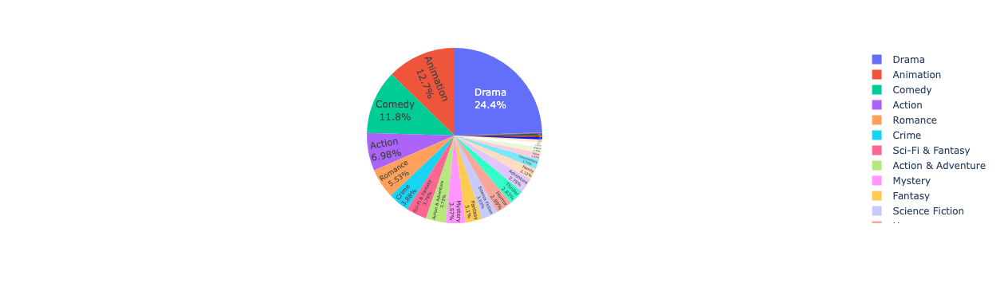

In [17]:
fig = px.pie(genre.explode(), "Genre",)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [18]:
dataSet['First Air Date'] = pd.to_datetime(dataSet['First Air Date'])
dataSet['Last Air Date'] = pd.to_datetime(dataSet['Last Air Date'])

In [19]:
dataSet['Year Completed'] = dataSet['Last Air Date'].dt.year

In [20]:
dataSet['Episode Count'] = dataSet['Episode Count'].astype('int')
dataSet['Season Count'] = dataSet['Season Count'].astype('int')

### Removing Names + Punctuations

In [20]:
nlp = spacy.load("en_core_web_sm")

Initialising a Parameter for logging

In [21]:
def generalPreprocessing(description: str) -> str:
    '''
    This function given a description, strips out any names it finds in it and performs basic nlp text normalisation
    '''

    global verbose
    clear_output(wait=True)
    print(f'Processing Description # {verbose}')

    # Remove Punctuations
    description = description.translate(str.maketrans('', '', string.punctuation))

    # Perform NER using spaCy
    doc = nlp(description)

    for entity in doc.ents:
      if entity.label_ == 'PERSON':
        description = description.replace(str(entity), '')

    # Convert to Lowercase
    description = description.lower()

    verbose += 1

    return " ".join(description.split())

In [22]:
verbose = 1

In [23]:
%%time
descriptions = descriptions.apply(generalPreprocessing)

Processing Description # 25939
CPU times: user 8min 57s, sys: 10.2 s, total: 9min 8s
Wall time: 9min 46s


## Visualising

In [22]:
dataSet.loc[dataSet['Original Language'] == 'Korean'].head()

,Id,Name,Original Name,Category,Genre,Rating,Votes,Popularity,First Air Date,Last Air Date,Original Language,Season Count,Episode Count,Overview,Year Completed
9,33238,Running Man,런닝맨,TV Show,"[Comedy, Reality]",8.3,167,263.498,2010-07-11,2023-11-19,Korean,1,680,"These days, variety entertainment is gradually...",2023
12,93405,Squid Game,오징어 게임,TV Show,"[Action & Adventure, Mystery, Drama]",7.8,13177,241.410,2021-09-17,2021-09-17,Korean,2,9,Hundreds of cash-strapped players accept a str...,2021
27,5092,Infinite Challenge,무한도전,TV Show,"[Reality, Comedy]",7.4,18,169.888,2005-04-23,2018-03-31,Korean,3,616,Infinite Challenge has been reported as the fi...,2018
31,492008,The Swordsman,검객,Movie,"[Action, Drama, History]",7.5,194,158.095,2020-09-23,2020-09-23,Korean,1,1,After being blinded in a coup against the king...,2020
35,99966,All of Us Are Dead,지금 우리 학교는,TV Show,"[Action & Adventure, Drama, Sci-Fi & Fantasy]",8.4,3393,150.319,2022-01-28,2022-01-28,Korean,2,12,A high school becomes ground zero for a zombie...,2022


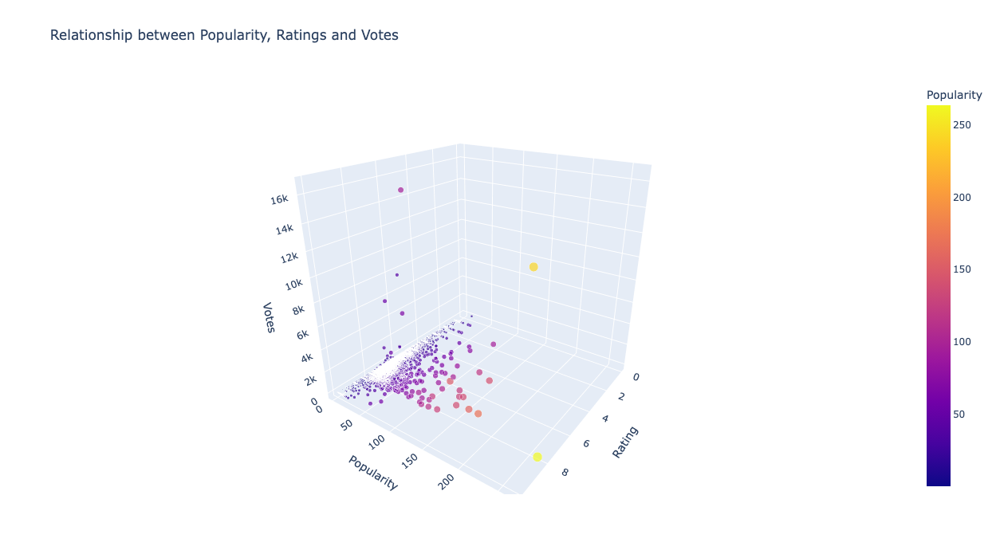

In [23]:
fig = px.scatter_3d(
    dataSet.loc[(dataSet['Original Language'] == 'Korean')],
    x='Rating',
    y='Popularity',
    z='Votes',
    size='Popularity',
    color='Popularity',
    height=700,
    hover_data=['Name', 'Year Completed', 'Original Language'],
    labels={'Original Language': 'Origin Country'},
    title='Relationship between Popularity, Ratings and Votes')
fig.show()

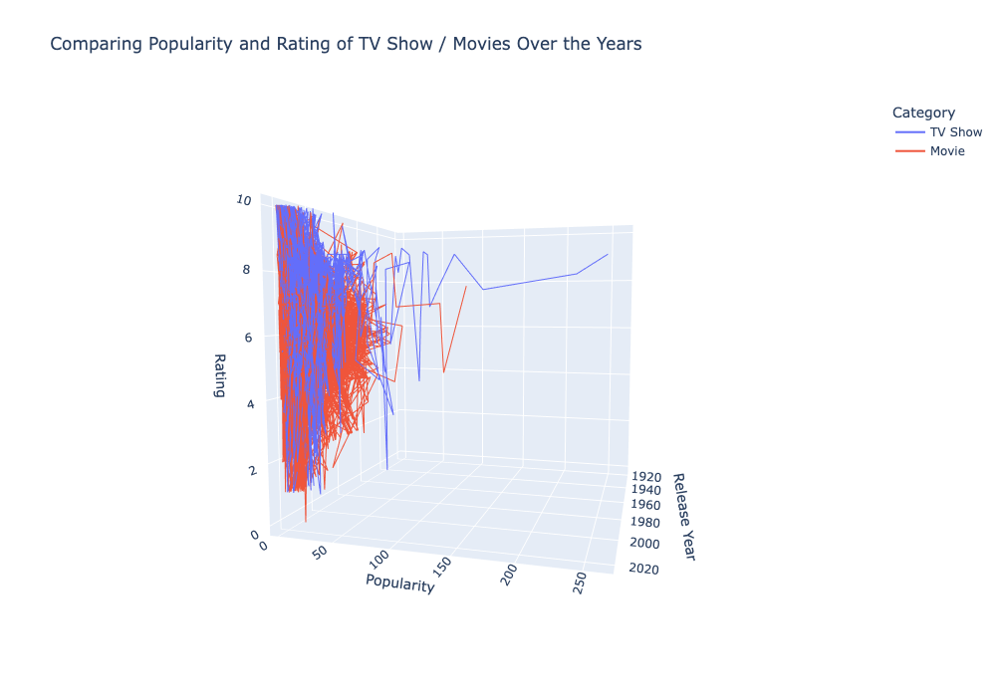

In [24]:
fig = px.line_3d(
    data_frame = dataSet.loc[(dataSet['Original Language'] == 'Korean')],
    x = 'Year Completed', y = 'Popularity', z = 'Rating', color = 'Category',
    height = 700,
    labels = {'Year Completed': 'Release Year'},
    title = 'Comparing Popularity and Rating of TV Show / Movies Over the Years'
)

fig.show()

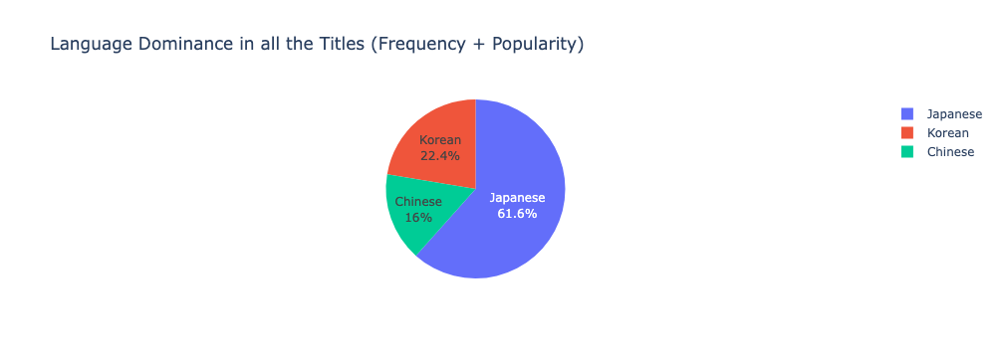

In [25]:
fig = px.pie(dataSet, 'Original Language', title = 'Language Dominance in all the Titles (Frequency + Popularity)',
             hover_data=['Popularity'])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

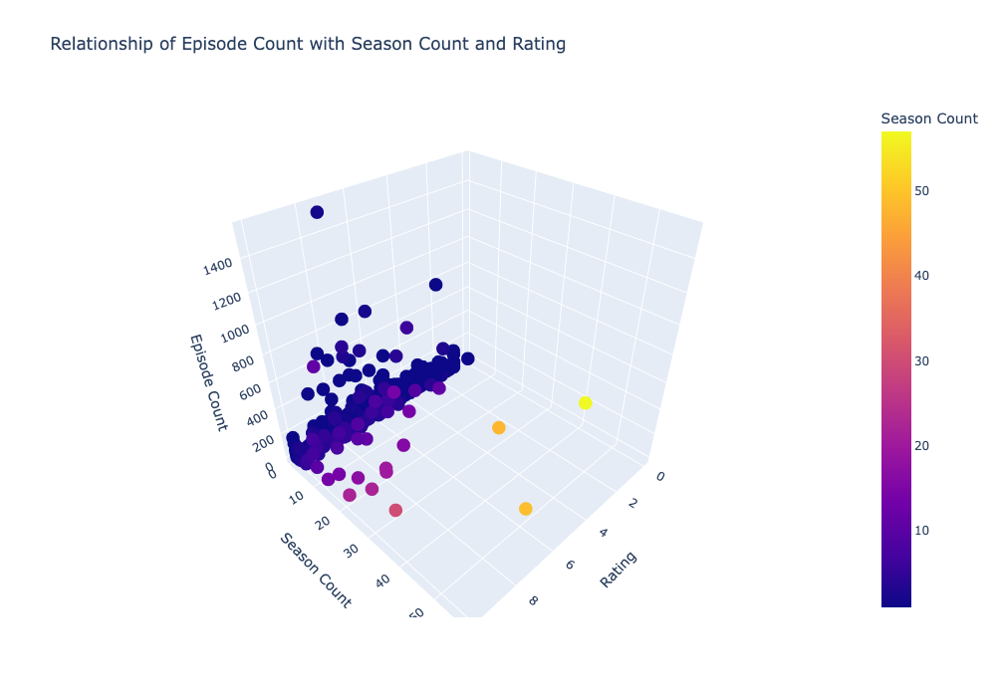

In [26]:
fig = px.scatter_3d(
    data_frame = dataSet.loc[(dataSet['Original Language'] == 'Korean')],
    x = 'Rating', y = 'Season Count', z = 'Episode Count', color = 'Season Count',
    height = 700,
    title = 'Relationship of Episode Count with Season Count and Rating',
    labels={'Original Language': 'Origin Country'},
    hover_data=['Name', 'Year Completed', 'Original Language'],
)

fig.show()

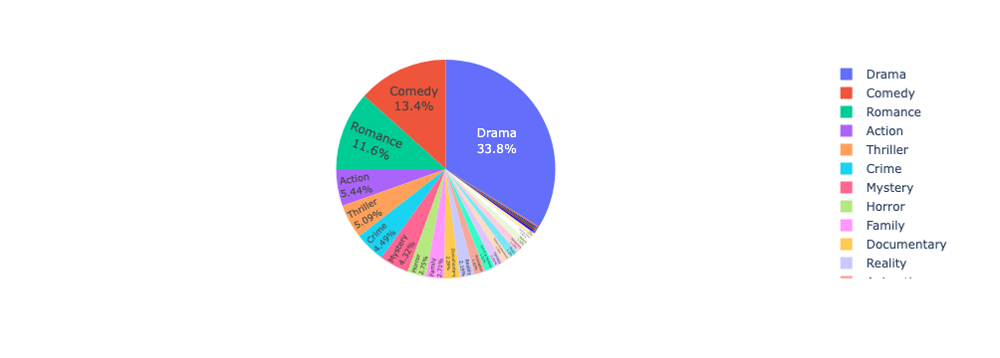

In [27]:
fig = px.pie(dataSet.loc[(dataSet['Original Language'] == 'Korean')].explode('Genre').dropna().loc[dataSet.loc[(dataSet['Original Language'] == 'Korean')].explode('Genre').dropna()['Genre'] != 'null'],
                "Genre",
                hover_data=['Popularity', 'Rating'],)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

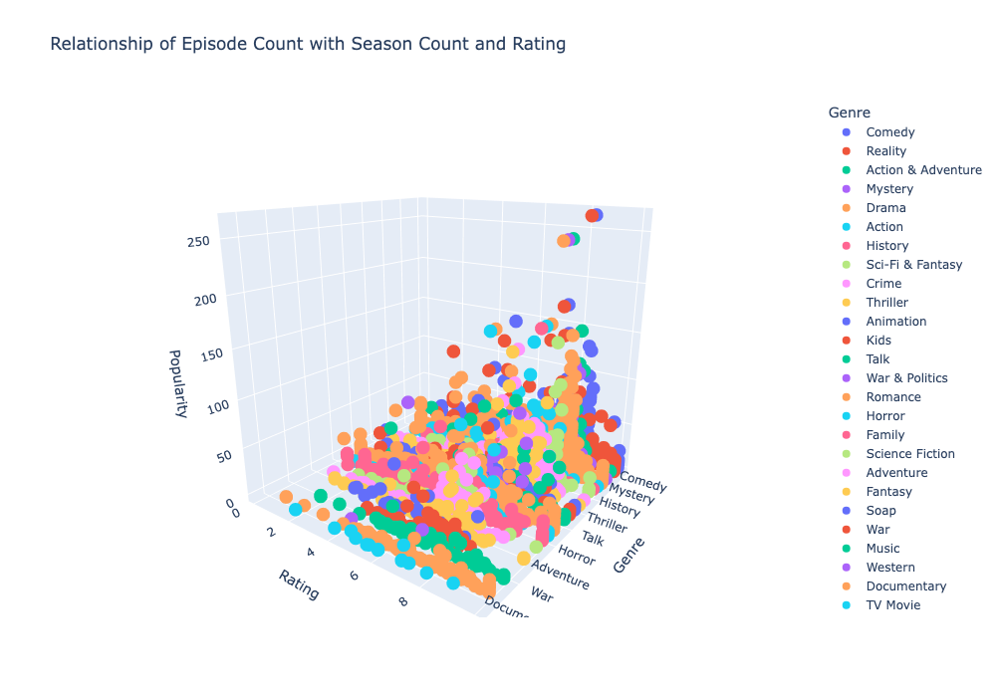

In [28]:
fig = px.scatter_3d(
    data_frame = dataSet.loc[(dataSet['Original Language'] == 'Korean')].explode('Genre').dropna(),
    x = 'Genre', y = 'Rating', z = 'Popularity', color = 'Genre',
    height = 700,
    title = 'Relationship of Episode Count with Season Count and Rating',
    labels={'Original Language': 'Origin Country'},
    hover_data=['Name', 'Year Completed', 'Original Language'],
)

fig.show()

---

## Additional Preprocessing Techniques

### Preprocessing Technique # 1

In [31]:
def fetchBigrams(description: str) -> str:
    '''
    This function given a description, removes stop words from it and return bigrams
    '''

    global verbose
    clear_output(wait=True)
    print(f'Applying Bigrams on Description # {verbose}')

    verbose += 1

    description = remove_stopwords(description)

    return '|'.join([bi[0] + ' ' + bi[1] for bi in bigrams(description.split())])

In [32]:
verbose = 1

In [33]:
%%time
descriptions_p1 = descriptions.apply(fetchBigrams)

Applying Bigrams on Description # 25939
CPU times: user 41 s, sys: 2.5 s, total: 43.5 s
Wall time: 45.6 s


### Preprocessing Technique # 2

In [34]:
def lemmatize(description: str) -> str:
    '''
    This function given a description, performs Lemmatisation on it
    '''

    global verbose
    clear_output(wait=True)
    print(f'Removing Stopwords from Description # {verbose}')

    doc = nlp(description)

    verbose += 1

    return " ".join([token.lemma_ for token in doc])

In [35]:
verbose = 1

In [36]:
%%time
descriptions_p2 = descriptions.apply(lemmatize)

Removing Stopwords from Description # 25939
CPU times: user 8min 36s, sys: 8.99 s, total: 8min 45s
Wall time: 9min 28s


### Comparing Preprocessing Techniques

In [37]:
print(f'Minimal Preprocessing: Length = {len(descriptions[12])}')
print(descriptions[12], '\n')
print(f'Preprocessing Technique # 1: Length = {len(descriptions_p1[12])}')
print(descriptions_p1[12], '\n')
print(f'Preprocessing Technique # 2: Length = {len(descriptions_p2[12])}')
print(descriptions_p2[12])

Minimal Preprocessing: Length = 146
hundreds of cashstrapped players accept a strange invitation to compete in childrens games—with high stakes but a tempting prize awaits the victor 

Preprocessing Technique # 1: Length = 235
hundreds cashstrapped|cashstrapped players|players accept|accept strange|strange invitation|invitation compete|compete childrens|childrens games—with|games—with high|high stakes|stakes tempting|tempting prize|prize awaits|awaits victor 

Preprocessing Technique # 2: Length = 141
hundred of cashstrappe player accept a strange invitation to compete in children game — with high stake but a tempting prize await the victor


## Training and Testing Sets

In [38]:
X_train, X_test, y_train, y_test = train_test_split(descriptions, genre, test_size=0.2)
X_train_p1, X_test_p1, y_train_p1, y_test_p1 = train_test_split(descriptions_p1, genre, test_size=0.2)
X_train_p2, X_test_p2, y_train_p2, y_test_p2 = train_test_split(descriptions_p2, genre, test_size=0.2)

In [39]:
X_train.shape

(20751,)

Number of Unique Words / Bigrams in our Descriptions

In [40]:
print('With Minimal Preprocessing:', len(X_train.apply(lambda x: x.split()).explode().unique()))

With Minimal Preprocessing: 47344


In [41]:
print('With Preprocessing Technique 1:', len(X_train_p1.apply(lambda x: x.split()).explode().unique()))

With Preprocessing Technique 1: 56579


In [42]:
print('With Preprocessing Technique 2:', len(X_train_p2.apply(lambda x: x.split()).explode().unique()))

With Preprocessing Technique 2: 37496


## Exploring Description Lengths

In [43]:
lengths = np.array(X_train.str.len())
print('Average Description Length with Minimal Preprocessing:', np.mean(lengths))

Average Description Length with Minimal Preprocessing: 330.5840682376753


In [44]:
lengths = np.array(X_train_p1.str.len())
print('Average Description Length with Preprocessing Technique 1:', np.mean(lengths))

Average Description Length with Preprocessing Technique 1: 410.3353573321768


In [45]:
lengths = np.array(X_train_p2.str.len())
print('Average Description Length with Preprocessing Technique 2:', np.mean(lengths))

Average Description Length with Preprocessing Technique 2: 319.2838899330153


In [46]:
fig = px.histogram(x=lengths, nbins=20, title='Description Lengths and their Frequencies for Minimal Preprocessing', labels = {'x': 'Description Lengths'})

fig.show()

### Optimal Padding Length:
- **Minimal Preprocessing:** 350
- **Preprocessing Technique # 1:** 600
- **Preprocessing Technique # 2:** 350

## Tokenizing (For Minimal & Technique 2)

In [47]:
tokenizer = Tokenizer(lower=True)
tokenizer_p1 = Tokenizer(lower=True, split='|')
tokenizer_p2 = Tokenizer(lower=True)

In [48]:
tokenizer.fit_on_texts(X_train)
tokenizer_p1.fit_on_texts(X_train_p1)
tokenizer_p2.fit_on_texts(X_train_p2)

Writing in a CSV File to Fetch Later by Frontend

In [49]:
# tokenizer_json = tokenizer.to_json()

# with open("tokenizer.json", "w") as json_file:
#     json.dump(tokenizer_json, json_file)

Fitting and Implementing Parameters

In [50]:
VOCAB_SIZE = len(tokenizer.word_index) + 1
VOCAB_SIZE_p1 = len(tokenizer_p1.word_index) + 1
VOCAB_SIZE_p2 = len(tokenizer_p2.word_index) + 1

In [51]:
X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)

In [52]:
X_train_p1 = tokenizer_p1.texts_to_sequences(X_train_p1)
X_test_p1 = tokenizer_p1.texts_to_sequences(X_test_p1)

In [53]:
X_train_p2 = tokenizer_p2.texts_to_sequences(X_train_p2)
X_test_p2 = tokenizer_p2.texts_to_sequences(X_test_p2)

## Padding Till Fix Lengths

In [54]:
MAX_LEN = 350
MAX_LEN_p1 = 600
MAX_LEN_p2 = 350

In [55]:
X_train = pad_sequences(X_train, padding='post', maxlen=MAX_LEN)
X_test = pad_sequences(X_test, padding='post', maxlen=MAX_LEN)

In [56]:
X_train_p1 = pad_sequences(X_train_p1, padding='post', maxlen=MAX_LEN_p1)
X_test_p1 = pad_sequences(X_test_p1, padding='post', maxlen=MAX_LEN_p1)

In [57]:
X_train_p2 = pad_sequences(X_train_p2, padding='post', maxlen=MAX_LEN_p2)
X_test_p2 = pad_sequences(X_test_p2, padding='post', maxlen=MAX_LEN_p2)

## Embedding Actual Variables

In [58]:
one_hot = MultiLabelBinarizer()
one_hot_p1 = MultiLabelBinarizer()
one_hot_p2 = MultiLabelBinarizer()

In [59]:
y_train = one_hot.fit_transform(y_train)
y_train_p1 = one_hot_p1.fit_transform(y_train_p1)
y_train_p2 = one_hot_p2.fit_transform(y_train_p2)

In [60]:
y_test = one_hot.transform(y_test)
y_test_p1 = one_hot_p1.transform(y_test_p1)
y_test_p2 = one_hot_p2.transform(y_test_p2)

In [61]:
one_hot.classes_

array(['Action', 'Action & Adventure', 'Adventure', 'Animation', 'Comedy',
       'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 'History',
       'Horror', 'Kids', 'Music', 'Mystery', 'News', 'Reality', 'Romance',
       'Sci-Fi & Fantasy', 'Science Fiction', 'Soap', 'TV Movie', 'Talk',
       'Thriller', 'War', 'War & Politics', 'Western'], dtype=object)

In [62]:
GENRE_CLASSES = y_train.shape[1]
GENRE_CLASSES

27

# Building RNN Model

In [63]:
def InsightsRNN(SEQ_LEN, VOCAB_SIZE, CLASSES):
    input_tensor = Input(shape=(SEQ_LEN,), dtype='int32')
    e = Embedding(VOCAB_SIZE, 300, input_length=SEQ_LEN, trainable=True)(input_tensor)
    x = Bidirectional(LSTM(128, return_sequences=True))(e)
    x = Bidirectional(LSTM(64, return_sequences=False))(x)
    x = Dense(64, activation='relu')(x)
    output_tensor = Dense(CLASSES, activation='sigmoid')(x)

    model = Model(input_tensor, output_tensor)
    model.summary()

    model.compile(optimizer=optimizers.Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

    return model

In [64]:
rnn_model = InsightsRNN(SEQ_LEN=MAX_LEN, VOCAB_SIZE=VOCAB_SIZE, CLASSES=GENRE_CLASSES)
rnn_model_p1 = InsightsRNN(SEQ_LEN=MAX_LEN_p1, VOCAB_SIZE=VOCAB_SIZE_p1, CLASSES=GENRE_CLASSES)
rnn_model_p2 = InsightsRNN(SEQ_LEN=MAX_LEN_p2, VOCAB_SIZE=VOCAB_SIZE_p2, CLASSES=GENRE_CLASSES)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 350)]             0         
                                                                 
 embedding (Embedding)       (None, 350, 300)          14203200  
                                                                 
 bidirectional (Bidirection  (None, 350, 256)          439296    
 al)                                                             
                                                                 
 bidirectional_1 (Bidirecti  (None, 128)               164352    
 onal)                                                           
                                                                 
 dense (Dense)               (None, 64)                8256      
                                                                 
 dense_1 (Dense)             (None, 27)                1755  

In [65]:
def plot_loss_and_accuracy(history, title, interval=1):
    loss = history.history['loss']
    accuracy = history.history['accuracy']

    epochs = range(1, len(loss) + 1)
    interval_epochs = range(interval, len(loss) + 1, interval)

    plt.figure(figsize=(12, 4))
    plt.suptitle(title, size=26, weight=600)

    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.xticks(interval_epochs)
    plt.title('Training Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, 'r', label='Training accuracy')
    plt.xticks(interval_epochs)
    plt.title('Training Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

## Trainning the Model

In [66]:
history = rnn_model.fit(X_train, y_train, epochs=10, verbose=1)

Epoch 1/10
649/649 [==============================] - 91s 122ms/step - loss: 0.2197 - accuracy: 0.2932
Epoch 2/10
649/649 [==============================] - 44s 68ms/step - loss: 0.1973 - accuracy: 0.3456
Epoch 3/10
649/649 [==============================] - 40s 61ms/step - loss: 0.1847 - accuracy: 0.3867
Epoch 4/10
649/649 [==============================] - 40s 61ms/step - loss: 0.1734 - accuracy: 0.4220
Epoch 5/10
649/649 [==============================] - 39s 60ms/step - loss: 0.1591 - accuracy: 0.4678
Epoch 6/10
649/649 [==============================] - 37s 57ms/step - loss: 0.1442 - accuracy: 0.5196
Epoch 7/10
649/649 [==============================] - 36s 56ms/step - loss: 0.1295 - accuracy: 0.5669
Epoch 8/10
649/649 [==============================] - 37s 57ms/step - loss: 0.1141 - accuracy: 0.6119
Epoch 9/10
649/649 [==============================] - 36s 55ms/step - loss: 0.0987 - accuracy: 0.6437
Epoch 10/10
649/649 [==============================] - 37s 57ms/step - loss: 0.08

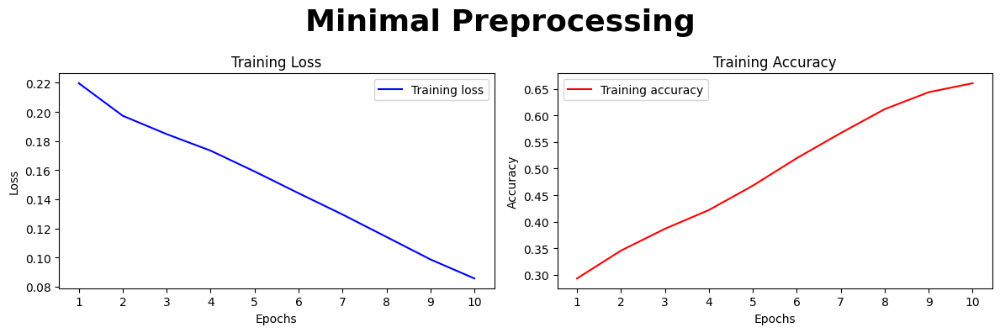

In [67]:
plot_loss_and_accuracy(history, 'Minimal Preprocessing')

In [68]:
history_p1 = rnn_model_p1.fit(X_train_p1, y_train_p1, epochs=10, verbose=1)

Epoch 1/10
649/649 [==============================] - 130s 188ms/step - loss: 0.2202 - accuracy: 0.2950
Epoch 2/10
649/649 [==============================] - 86s 133ms/step - loss: 0.1948 - accuracy: 0.3706
Epoch 3/10
649/649 [==============================] - 82s 126ms/step - loss: 0.1806 - accuracy: 0.4080
Epoch 4/10
649/649 [==============================] - 77s 119ms/step - loss: 0.1608 - accuracy: 0.4415
Epoch 5/10
649/649 [==============================] - 76s 118ms/step - loss: 0.1354 - accuracy: 0.5277
Epoch 6/10
649/649 [==============================] - 75s 115ms/step - loss: 0.1092 - accuracy: 0.5900
Epoch 7/10
649/649 [==============================] - 74s 114ms/step - loss: 0.0829 - accuracy: 0.6307
Epoch 8/10
649/649 [==============================] - 73s 112ms/step - loss: 0.0620 - accuracy: 0.6520
Epoch 9/10
649/649 [==============================] - 74s 114ms/step - loss: 0.0470 - accuracy: 0.6625
Epoch 10/10
649/649 [==============================] - 74s 114ms/step - 

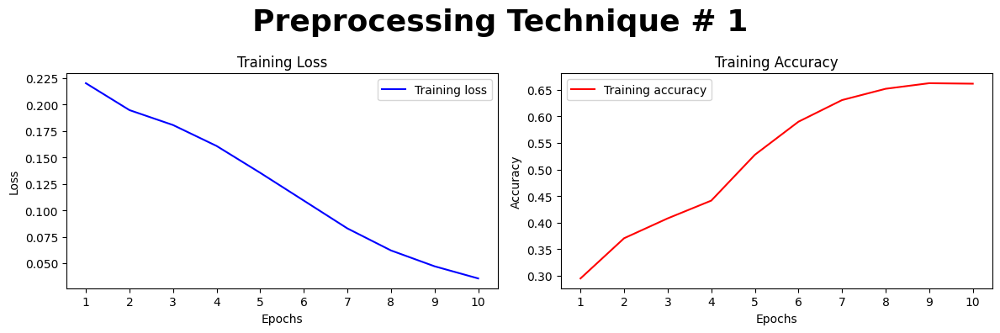

In [69]:
plot_loss_and_accuracy(history_p1, 'Preprocessing Technique # 1')

In [70]:
history_p2 = rnn_model_p2.fit(X_train_p2, y_train_p2, epochs=10, verbose=1)

Epoch 1/10
649/649 [==============================] - 83s 118ms/step - loss: 0.2217 - accuracy: 0.2849
Epoch 2/10
649/649 [==============================] - 43s 66ms/step - loss: 0.2031 - accuracy: 0.3187
Epoch 3/10
649/649 [==============================] - 39s 61ms/step - loss: 0.1847 - accuracy: 0.3779
Epoch 4/10
649/649 [==============================] - 38s 58ms/step - loss: 0.1670 - accuracy: 0.4379
Epoch 5/10
649/649 [==============================] - 37s 57ms/step - loss: 0.1532 - accuracy: 0.4860
Epoch 6/10
649/649 [==============================] - 37s 57ms/step - loss: 0.1407 - accuracy: 0.5193
Epoch 7/10
649/649 [==============================] - 36s 55ms/step - loss: 0.1286 - accuracy: 0.5503
Epoch 8/10
649/649 [==============================] - 35s 55ms/step - loss: 0.1172 - accuracy: 0.5827
Epoch 9/10
649/649 [==============================] - 36s 56ms/step - loss: 0.1058 - accuracy: 0.6169
Epoch 10/10
649/649 [==============================] - 36s 55ms/step - loss: 0.09

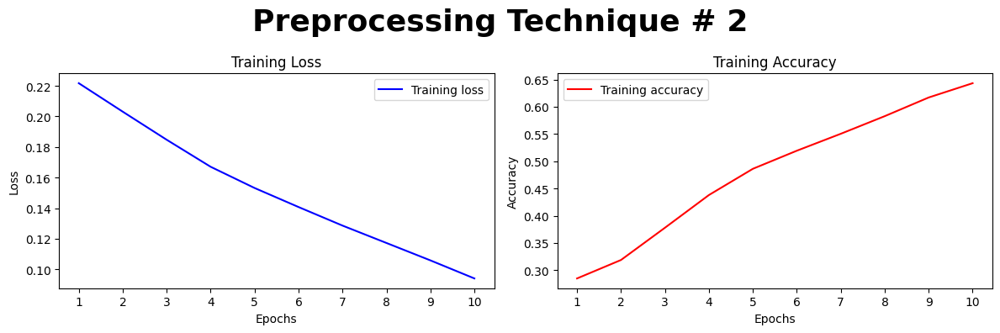

In [71]:
plot_loss_and_accuracy(history_p2, 'Preprocessing Technique # 2')

## Testing RNN Model

### Minimal Preprocessing

In [72]:
test_loss, test_acurracy = rnn_model.evaluate(X_test, y_test)

print("Test Accuracy: {}".format(test_acurracy))
print("Test Loss: {}".format(test_loss))

163/163 [==============================] - 5s 23ms/step - loss: 0.2364 - accuracy: 0.3998
Test Accuracy: 0.3997687101364136
Test Loss: 0.2363710254430771


In [73]:
y_cap = rnn_model.predict(X_test)
y_cap = np.round(y_cap, 0).astype(int)

163/163 [==============================] - 4s 19ms/step


In [74]:
print(classification_report(y_test, y_cap, target_names=one_hot.classes_, zero_division=0))

                    precision    recall  f1-score   support

            Action       0.42      0.43      0.43       706
Action & Adventure       0.39      0.27      0.32       413
         Adventure       0.28      0.17      0.21       289
         Animation       0.68      0.64      0.66      1359
            Comedy       0.41      0.31      0.36      1213
             Crime       0.46      0.32      0.37       421
       Documentary       0.56      0.41      0.47       183
             Drama       0.65      0.77      0.70      2562
            Family       0.50      0.00      0.01       220
           Fantasy       0.24      0.12      0.16       318
           History       0.27      0.18      0.22       101
            Horror       0.36      0.16      0.22       320
              Kids       0.00      0.00      0.00        59
             Music       0.39      0.38      0.39       130
           Mystery       0.29      0.13      0.18       412
              News       0.00      0.00

### Preprocessing Technique # 1

In [75]:
test_loss, test_acurracy = rnn_model_p1.evaluate(X_test_p1, y_test_p1)

print("Test Accuracy: {}".format(test_acurracy))
print("Test Loss: {}".format(test_loss))

163/163 [==============================] - 7s 34ms/step - loss: 0.4815 - accuracy: 0.2498
Test Accuracy: 0.24980725347995758
Test Loss: 0.48147207498550415


In [76]:
y_cap_p1 = rnn_model_p1.predict(X_test_p1)
y_cap_p1 = np.round(y_cap_p1, 0).astype(int)

163/163 [==============================] - 7s 35ms/step


In [77]:
print(classification_report(y_test_p1, y_cap_p1, target_names=one_hot_p1.classes_, zero_division=0))

                    precision    recall  f1-score   support

            Action       0.30      0.11      0.16       754
Action & Adventure       0.38      0.04      0.07       369
         Adventure       0.29      0.09      0.14       279
         Animation       0.51      0.34      0.41      1322
            Comedy       0.35      0.22      0.27      1269
             Crime       0.21      0.10      0.14       419
       Documentary       0.19      0.02      0.03       196
             Drama       0.57      0.51      0.54      2586
            Family       0.04      0.02      0.03       211
           Fantasy       0.11      0.04      0.05       333
           History       0.14      0.04      0.06       119
            Horror       0.10      0.07      0.09       338
              Kids       0.00      0.00      0.00        37
             Music       0.17      0.13      0.15       137
           Mystery       0.16      0.05      0.08       373
              News       0.00      0.00

### Preprocessing Technique # 2

In [78]:
test_loss, test_acurracy = rnn_model_p2.evaluate(X_test_p2, y_test_p2)

print("Test Accuracy: {}".format(test_acurracy))
print("Test Loss: {}".format(test_loss))

163/163 [==============================] - 5s 23ms/step - loss: 0.2271 - accuracy: 0.3892
Test Accuracy: 0.38916730880737305
Test Loss: 0.22712920606136322


In [79]:
y_cap_p2 = rnn_model_p2.predict(X_test_p2)
y_cap_p2 = np.round(y_cap_p2, 0).astype(int)

163/163 [==============================] - 4s 19ms/step


In [80]:
print(classification_report(y_test_p2, y_cap_p2, target_names=one_hot_p2.classes_, zero_division=0))

                    precision    recall  f1-score   support

            Action       0.40      0.43      0.41       730
Action & Adventure       0.38      0.17      0.23       392
         Adventure       0.30      0.16      0.21       284
         Animation       0.68      0.58      0.63      1322
            Comedy       0.48      0.35      0.40      1314
             Crime       0.41      0.31      0.35       407
       Documentary       0.63      0.29      0.40       190
             Drama       0.67      0.69      0.68      2582
            Family       0.00      0.00      0.00       220
           Fantasy       0.24      0.08      0.12       328
           History       0.39      0.07      0.12       124
            Horror       0.40      0.35      0.37       306
              Kids       0.00      0.00      0.00        39
             Music       0.77      0.24      0.36       153
           Mystery       0.41      0.12      0.18       408
              News       0.00      0.00

### Testing Random Plots

In [81]:
desc = [generalPreprocessing("""Hundreds of cash-strapped contestants accept an invitation to compete in children's games for a tempting prize, but the stakes are deadly.""")]

Processing Description # 25940


In [82]:
desc = tokenizer.texts_to_sequences(desc)
desc = pad_sequences(desc, padding='post', maxlen=MAX_LEN)

y_cap = rnn_model.predict(desc)

1/1 [==============================] - 0s 34ms/step


In [83]:
threshold = 0.5

In [84]:
one_hot.classes_[np.where(y_cap[0] >= threshold)]

array(['Crime', 'Drama', 'Mystery'], dtype=object)

# Building Machine Learning Model

In [85]:
classifiers = {}

In [86]:
one_hot.classes_

array(['Action', 'Action & Adventure', 'Adventure', 'Animation', 'Comedy',
       'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 'History',
       'Horror', 'Kids', 'Music', 'Mystery', 'News', 'Reality', 'Romance',
       'Sci-Fi & Fantasy', 'Science Fiction', 'Soap', 'TV Movie', 'Talk',
       'Thriller', 'War', 'War & Politics', 'Western'], dtype=object)

In [87]:
classifier = OneVsRestClassifier(MultinomialNB(), verbose=1)
classifier_p1 = OneVsRestClassifier(MultinomialNB(), verbose=1)
classifier_p2 = OneVsRestClassifier(MultinomialNB(), verbose=1)

## Trainning Machine Learning Model

In [88]:
classifier.fit(X_train, y_train)
classifier_p1.fit(X_train_p1, y_train_p1)
classifier_p2.fit(X_train_p2, y_train_p2)

OneVsRestClassifier(estimator=MultinomialNB(), verbose=1)

## Testing Machine Learning Model

### Minimal Preprocessing

In [89]:
y_cap = classifier.predict(X_test)

In [90]:
print(classification_report(y_test, y_cap, target_names=one_hot.classes_, zero_division=0))

                    precision    recall  f1-score   support

            Action       0.14      0.81      0.24       706
Action & Adventure       0.10      0.35      0.16       413
         Adventure       0.06      0.64      0.11       289
         Animation       0.31      0.36      0.33      1359
            Comedy       0.23      0.36      0.28      1213
             Crime       0.09      0.71      0.16       421
       Documentary       0.03      0.37      0.06       183
             Drama       0.50      0.32      0.39      2562
            Family       0.04      0.32      0.07       220
           Fantasy       0.06      0.62      0.11       318
           History       0.02      0.64      0.05       101
            Horror       0.06      0.75      0.12       320
              Kids       0.01      0.29      0.03        59
             Music       0.03      0.76      0.05       130
           Mystery       0.08      0.59      0.14       412
              News       0.00      0.00

## Preprocessing Technique # 1

In [91]:
y_cap_p1 = classifier_p1.predict(X_test_p1)

In [92]:
print(classification_report(y_test_p1, y_cap_p1, target_names=one_hot_p1.classes_, zero_division=0))

                    precision    recall  f1-score   support

            Action       0.14      0.97      0.25       754
Action & Adventure       0.14      0.01      0.02       369
         Adventure       0.05      0.85      0.10       279
         Animation       0.52      0.01      0.03      1322
            Comedy       0.21      0.09      0.12      1269
             Crime       0.08      0.95      0.15       419
       Documentary       0.05      0.73      0.09       196
             Drama       0.52      0.57      0.54      2586
            Family       0.02      0.01      0.02       211
           Fantasy       0.06      0.19      0.09       333
           History       0.02      0.65      0.04       119
            Horror       0.07      0.98      0.12       338
              Kids       0.01      0.05      0.01        37
             Music       0.03      0.92      0.05       137
           Mystery       0.07      0.65      0.13       373
              News       0.00      0.00

## Preprocessing Technique # 2

In [93]:
y_cap_p2 = classifier_p2.predict(X_test_p2)

In [94]:
print(classification_report(y_test_p2, y_cap_p2, target_names=one_hot_p2.classes_, zero_division=0))

                    precision    recall  f1-score   support

            Action       0.15      0.81      0.25       730
Action & Adventure       0.11      0.37      0.17       392
         Adventure       0.06      0.65      0.11       284
         Animation       0.31      0.36      0.33      1322
            Comedy       0.27      0.40      0.33      1314
             Crime       0.08      0.72      0.15       407
       Documentary       0.04      0.52      0.07       190
             Drama       0.50      0.40      0.44      2582
            Family       0.04      0.33      0.08       220
           Fantasy       0.06      0.60      0.12       328
           History       0.03      0.67      0.06       124
            Horror       0.06      0.76      0.12       306
              Kids       0.01      0.31      0.02        39
             Music       0.03      0.77      0.06       153
           Mystery       0.08      0.51      0.14       408
              News       0.00      0.00

### Testing Random Plots

In [95]:
desc = [generalPreprocessing("""Hundreds of cash-strapped contestants accept an invitation to compete in children's games for a tempting prize, but the stakes are deadly.""")]
desc[0] = lemmatize(desc[0])

Removing Stopwords from Description # 25942


In [96]:
desc = tokenizer_p2.texts_to_sequences(desc)
desc = pad_sequences(desc, padding='post', maxlen=MAX_LEN_p2)

In [97]:
one_hot.classes_[np.where(classifier_p2.predict(desc)[0] == 1)[0]]

array(['Action', 'Crime', 'Fantasy', 'Horror', 'Music', 'Mystery',
       'Reality', 'Talk', 'Thriller', 'War', 'War & Politics', 'Western'],
      dtype=object)

---